# Analysis for the partial R9 data

Source: https://hackmd.io/QCCJWZE0Ru27X_GRk6UKjQ

## Dependences

In [3]:
%load_ext autotime
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("..")

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
time: 48.7 ms (started: 2021-03-22 17:46:32 -03:00)


In [4]:
# Library dependences
import cloudpickle
import holoviews as hv
import plotly.express as px
import networkx as nx
import pandas as pd
import numpy as np

# Local dependences
#from model_gitcoin.parts.utils import plot_contributions
from qf_research.functions import total_amount
from qf_research.functions import contributions_to_graph
from qf_research.definitions import optimality_gap_per_grant
from qf_research.definitions import amount_per_grant

time: 51.6 ms (started: 2021-03-22 17:46:32 -03:00)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
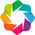

time: 1.92 s (started: 2021-03-22 17:46:32 -03:00)


In [5]:
hv.extension('bokeh')

## Load data from R9

In [6]:
PATH = '../data/2021-03-18/2021-03-18-round9-contributions.csv.xz'

time: 60.3 ms (started: 2021-03-22 17:46:35 -03:00)


In [7]:
df = pd.read_csv(PATH, compression='xz')

time: 1.12 s (started: 2021-03-22 17:46:35 -03:00)


In [8]:
# Reverse engineer the simulation so that we don't need to run anything
list_of_contributions = list(df.to_dict(orient='index').values())
reverse_engineered_results = [list_of_contributions]

time: 1.57 s (started: 2021-03-22 17:46:37 -03:00)


## Overview of the graph

In [9]:
G = contributions_to_graph(reverse_engineered_results[0][0:1000])

colors = hv.Cycle('Category10').values
fig = hv.Graph.from_networkx(G, nx.fruchterman_reingold_layout)
fig.opts(cmap=colors, node_color='attacker', edge_line_width=0.5, node_size=8, height=300, width=600)

:Graph   [start,end]   (amount,created_on,flag,success,sybil_score,time_sequence)

time: 1.64 s (started: 2021-03-22 17:46:38 -03:00)


## EDA

In [10]:
px.histogram(np.log(df.query('amount > 0').amount), log_y=True, nbins=20)

time: 3.46 s (started: 2021-03-22 17:46:40 -03:00)


In [11]:
len(df.query('amount > 1')) / len(df)

0.5868905094954825

time: 112 ms (started: 2021-03-22 17:46:45 -03:00)


In [12]:
px.histogram(df.sybil_score)

time: 1.83 s (started: 2021-03-22 17:46:45 -03:00)


In [13]:
s = df.groupby('grant').amount.sum()
fig_df = s.reset_index()
px.histogram(np.log(fig_df.amount), log_y=True)

/home/danlessa/.miniconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning:

divide by zero encountered in log



time: 396 ms (started: 2021-03-22 17:46:48 -03:00)


In [14]:
fig_df = df.query('amount > 0')

px.density_heatmap(fig_df,
           x=np.log(fig_df.amount),
           y='sybil_score')



time: 3.04 s (started: 2021-03-22 17:46:49 -03:00)


In [15]:
fig_df = df.query('amount > 0').groupby('grant').mean()

px.density_heatmap(fig_df,
           x=np.log(fig_df.amount),
           y='sybil_score')

time: 385 ms (started: 2021-03-22 17:46:54 -03:00)


In [16]:
fig_df = df.query('amount > 0').groupby('grant').agg(['mean', 'sum', 'std'])

px.density_heatmap(x=np.log(fig_df['amount']['sum']),
                   y=fig_df['sybil_score']['mean'])

time: 465 ms (started: 2021-03-22 17:46:54 -03:00)


In [17]:
fig_df = df.query('amount > 0').groupby('grant').agg(['mean', 'sum', 'std'])

px.density_heatmap(x=np.log(fig_df['amount']['std']),
                   y=fig_df['sybil_score']['mean'])

time: 515 ms (started: 2021-03-22 17:46:55 -03:00)


In [18]:
from qf_research.definitions import grant_conjuctured_optimality_gap
from tqdm.auto import tqdm
G = contributions_to_graph(reverse_engineered_results[0][0:100])
grants = {n for n, data in G.nodes(data=True) if data['type'] == 'grant'} 

output = {}
for grant in tqdm(grants):
    output[grant] = grant_conjuctured_optimality_gap(G, grant)


  0%|          | 0/39 [00:00<?, ?it/s]


AssertionError: (258.083619359538, 460.1791348920636, 'BeyondNFT')

In [23]:
s = pd.Series(output)
px.histogram(s, title='Conjuctured Optimality Gap')

time: 340 ms (started: 2021-03-18 15:02:51 -03:00)


In [117]:
from qf_research.definitions import grants_funding_share

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
funding_share = pd.Series(grants_funding_share(G, 1))

time: 1.33 s (started: 2021-03-18 16:36:39 -03:00)


In [118]:
funding_share.name = 'funding_share'

time: 50.8 ms (started: 2021-03-18 16:36:44 -03:00)


In [119]:
px.histogram(funding_share, title='Funding Share', log_y=True)

time: 229 ms (started: 2021-03-18 16:36:45 -03:00)


In [120]:
s_1 = df.groupby('grant').sybil_score.mean()

s_1.reset_index()

,grant,sybil_score
0,#SupportEIP1559,-0.285714
1,$DYP prevents the whale advantage in DeFi.,0.222222
2,(Polygon) Matic Mitra [Panvala League],0.125000
3,/r/ethstaker,0.014663
4,13000usd of unfair debt,-1.000000
...,...,...
644,✨ Astral,-0.545455
645,✨ MintGate - Gate Content Using Tokens,0.555556
646,✨ MintGate turns any online content into exclu...,-0.710526
647,やさしいDeFi (Yasashi DeFi),0.578313


time: 151 ms (started: 2021-03-18 16:36:46 -03:00)


In [121]:
funding_share.sort_values(ascending=False)

Gitcoin Grants Round 9 + Dev Fund                                                                                                           0.458460
Ethereum Swarm                                                                                                                              0.104282
POAP (Proof of Attendance Protocol)                                                                                                         0.064150
Circles UBI                                                                                                                                 0.054268
Gitcoin Grants Official Matching Pool Fund                                                                                                  0.041332
                                                                                                                                              ...   
NiftyCrates                                                                                               

time: 100 ms (started: 2021-03-18 16:36:47 -03:00)


In [180]:
def inject_attack_vector_1(G, budget=100):
    attack_G = G.copy()
    ATTACK_VECTOR_CONTRIBUTIONS = 11
    grants  =  {0}
    users = range(1, ATTACK_VECTOR_CONTRIBUTIONS + 1)

    grants = [str(el) for el in grants]
    users = [str(el) for el in users]

    attack_G.add_nodes_from(grants, type='grant')
    attack_G.add_nodes_from(users, type='contributor')

    for i in users:
        attack_G.add_edge('0', str(i), amount=budget / ATTACK_VECTOR_CONTRIBUTIONS)
    return attack_G, grants


def inject_attack_vector_2(G, budget=100):
    G_B = G.copy()
    grants  =  set(range(3))
    tot = set(range(12))
    users = tot.difference(grants)
    edge_list = [(0,3),
                (0,4),
                (0,5),
                (0,6),
                (1,6),
                (1,7),
                (1,8),
                (1,9),
                (2,9),
                (2,10),
                (2,11)]

    edge_list = [(str(el[0]), str(el[1]))
                for el in edge_list]
    grants = [str(el) for el in grants]
    users = [str(el) for el in users]

    G2 = nx.Graph()
    # Add nodes with the node attribute "bipartite"
    G_B.add_nodes_from(grants, bipartite=0, type='grant')
    G_B.add_nodes_from(users, bipartite=1, type='contributor')
    # Add nodes with the node attribute "bipartite"
    G_B.add_edges_from(edge_list, amount=budget / len(tot))

    nx.set_node_attributes(G_B, 'no', 'attacker')
    for node in (grants + users):
        G_B.nodes[node]['attacker'] = 'yes'
    return G_B, grants


time: 31.1 ms (started: 2021-03-18 16:54:58 -03:00)


### Many to One

In [164]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_1(G, budget=10)
funding_share = pd.Series(grants_funding_share(G_B, 1))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0169%
time: 5.95 s (started: 2021-03-18 16:50:04 -03:00)


In [166]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_1(G, budget=1000)
funding_share = pd.Series(grants_funding_share(G_B, 1))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0169%
time: 1.6 s (started: 2021-03-18 16:51:04 -03:00)


In [165]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_1(G, budget=10)
funding_share = pd.Series(grants_funding_share(G_B, 1, simple=True))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0031%
time: 2.27 s (started: 2021-03-18 16:50:10 -03:00)


In [167]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_1(G, budget=1000)
funding_share = pd.Series(grants_funding_share(G_B, 1, simple=True))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.3052%
time: 2.14 s (started: 2021-03-18 16:51:12 -03:00)


### Many to Many

In [181]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_2(G, budget=10)
funding_share = pd.Series(grants_funding_share(G_B, 1))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0046%
time: 2.73 s (started: 2021-03-18 16:55:04 -03:00)


In [182]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_2(G, budget=10000)
funding_share = pd.Series(grants_funding_share(G_B, 1))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0046%
time: 4.88 s (started: 2021-03-18 16:55:07 -03:00)


In [176]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_2(G, budget=10)
funding_share = pd.Series(grants_funding_share(G_B, 1, simple=True))
attacker_funding_share = sum(   funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0008%
time: 525 ms (started: 2021-03-18 16:54:12 -03:00)


In [177]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_2(G, budget=1000)
funding_share = pd.Series(grants_funding_share(G_B, 1, simple=True))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.0765%
time: 531 ms (started: 2021-03-18 16:54:13 -03:00)


In [178]:
from qf_research.definitions import grant_conjuctured_optimality_gap

G = contributions_to_graph(reverse_engineered_results[0][0:10000])
G_B, attacker_grants = inject_attack_vector_2(G, budget=10000)
funding_share = pd.Series(grants_funding_share(G_B, 1, simple=True))
attacker_funding_share = sum(funding_share[g] for g in attacker_grants)
print(f"{attacker_funding_share:.4%}")

0.7596%
time: 1.44 s (started: 2021-03-18 16:54:15 -03:00)


In [203]:
s = df.groupby('contributor').amount.sum()

px.histogram(s[s < 3000], log_y=True)

time: 167 ms (started: 2021-03-18 17:05:03 -03:00)


In [210]:
s = df.groupby('contributor').amount.std()

px.histogram(s[s < 100], log_y=True, nbins=10)

time: 194 ms (started: 2021-03-18 17:06:45 -03:00)
